In [1]:
import loompy
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import sparse
import tomotopy as tt

# suppress INFO
import logging
logger = logging.getLogger()
logger.setLevel(logging.CRITICAL)

In [2]:
k = 35
modelsrc = 'Recombined3Clean2_C_FBPC'
tp_attr = "TP_%s_%s" % (k, modelsrc)
model = tt.LDAModel.load('HumanAdult_Recombined3Clean2_C_FBPC_35topics_model.bin')
cells = np.loadtxt('HumanAdult_Recombined3Clean2_C_FBPC_35topics_cells.txt').astype('int')
transformed = np.vstack([doc.get_topic_dist() for doc in model.docs])
print(transformed.shape)

(78812, 35)


In [3]:
# List the most contributing genes in each topic:
e2g = { v:k for k,v in [l.strip().split('\t') for l in open("genename2ensg.tab")] }
for i in range(k):
    print("Topic %s:" % i, end=" ")
    topicwords = model.get_topic_words(i, top_n=5)
    for t in topicwords:
        g = e2g[t[0]] if t[0] in e2g else t[0]
        print("%8s:%.4f" % (g,t[1]), end=" ")
    print()

Topic 0:   DNAJB1:0.0075     NKD1:0.0026   HMGCS1:0.0026     CCN1:0.0024   MRPL18:0.0023 
Topic 1:   SETBP1:0.0014     AKT3:0.0013   SAMD4A:0.0013   RAD51B:0.0012   EXOC6B:0.0012 
Topic 2:     SYT1:0.0068    FGF14:0.0042     GPC3:0.0040   CRABP1:0.0038    TRPM3:0.0037 
Topic 3:      TTR:0.1082 C11orf96:0.0033    GRID2:0.0025   IFITM1:0.0024    COX8A:0.0022 
Topic 4:  SULT1E1:0.0158    POSTN:0.0138 ENSG00000284695:0.0132    ROBO2:0.0098    LRP1B:0.0076 
Topic 5:     H4C3:0.0090     TYMS:0.0075   DIAPH3:0.0034    HMGB2:0.0033    CENPP:0.0033 
Topic 6:    ITIH2:0.0066    LAMC3:0.0058  SPARCL1:0.0051   IGFBP7:0.0048     SLF1:0.0043 
Topic 7:   NFE2L3:0.0074    INTS6:0.0060    TEX14:0.0055    SOX11:0.0048  SLC10A1:0.0045 
Topic 8:   IGFBP5:0.0336   NKAIN2:0.0101   RNF220:0.0051   APCDD1:0.0050    MFAP4:0.0046 
Topic 9:     EGR1:0.0092     FOSB:0.0064     ATF3:0.0062     BTG2:0.0055 PPP1R15A:0.0046 
Topic 10:     CCN2:0.0448     CCN1:0.0210    TAGLN:0.0098   CRABP1:0.0094   SAMD4A:0.0089 
To

# Xenium data

In [4]:
adata_loom = 'Xenium_with10xclusters_he24_pcw6_mesenchymal.loom'

with loompy.connect(adata_loom) as ds:
    if tp_attr in ds.ca:
        adata_transformed = ds.ca[tp_attr]
    else:
        print("Shape of %s: %s" % (adata_loom, ds.shape))
        # If Accessions are missing, we need to use a translation table from Gene name to Accessions (ENSGxxx)
        if False: # 'Accession' in ds.ra:
            adata_accessions = np.array(ds.ra.Accession[:])
        else:
            g2e = { k:v for k,v in [l.strip().split('\t') for l in open("genename2ensg.tab")] }
            adata_accessions = np.array([ g2e[k] for k in ds.ra.Gene ])
            ds.ra.Accession = adata_accessions
        # use only genes in the pre-fit model
        selected_genes = pd.Series(adata_accessions).isin(list(model.vocabs)).to_numpy()
        selected_genes = np.where(selected_genes)[0]
        print("# selected genes: %s" % len(selected_genes))
        data = ds.sparse(rows=selected_genes).A
        # construct corpus
        n_cells = ds.shape[1]
        corpus = tt.utils.Corpus()
        [ corpus.add_doc( list(np.repeat(adata_accessions[selected_genes], data[:, i].astype('int').T, axis=0)) ) 
            for i in range(n_cells) ]
        adata_transformed = model.infer(corpus, together=False)[0]
        adata_transformed = np.vstack([doc.get_topic_dist() for doc in adata_transformed])
        print(adata_transformed.shape)
        # Save topic loading for later quick access:
        ds.ca[tp_attr] = adata_transformed

Shape of adata_dev_meninges_with10xclusters_he24_pcw6_mesenchymal.loom: (389, 267016)
# selected genes: 306
(267016, 35)


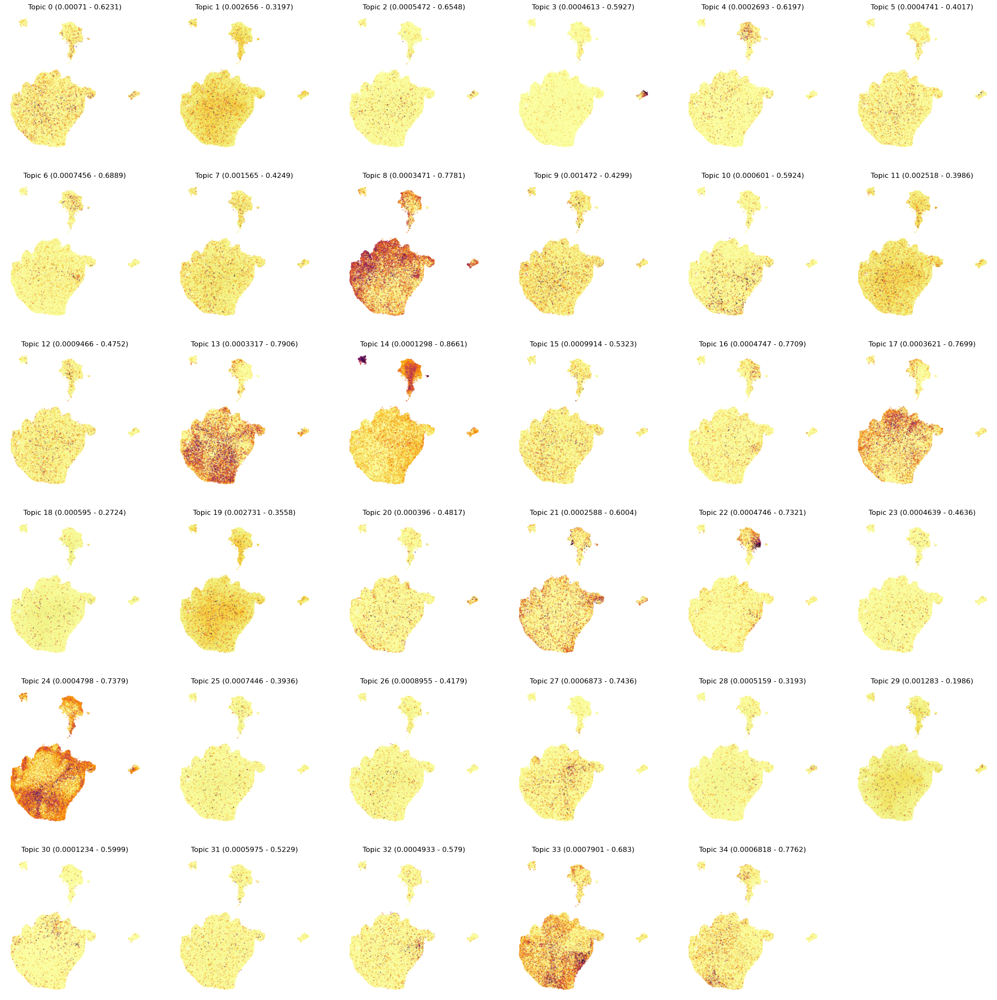

In [5]:
# Colorize the UMAP with the loading of each topic on the cells
plt.figure(None, (30, 30), facecolor='white')
gs = plt.GridSpec(6, 6)
with loompy.connect(adata_loom, 'r') as ds:
    xs = ds.ca.UMAP[:, 0]
    ys = ds.ca.UMAP[:, 1]
    for i in range(k):
        plt.subplot(gs[i])
        topicweights = adata_transformed[:,i]
        weights = np.minimum(1.0, topicweights / np.percentile(topicweights, 99.9))
        #  weights = topicweights / max(topicweights)
        plt.scatter(xs, ys, c=weights, alpha=0.5, s=5, lw=0, rasterized=True, cmap='inferno_r')
        plt.axis('off')
        plt.title("Topic %s (%.4g - %.4g)" % (i, min(topicweights), max(topicweights)), fontsize=12)
        plt.margins(0.05, 0.05)        
plt.show()

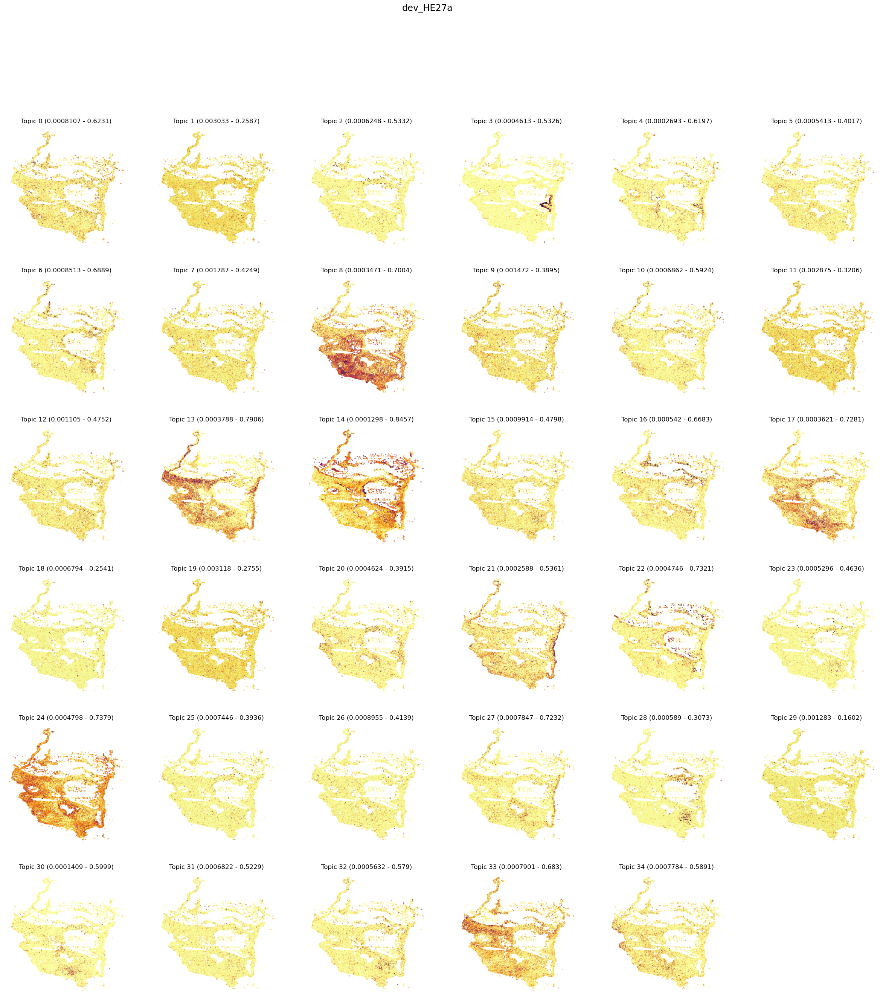

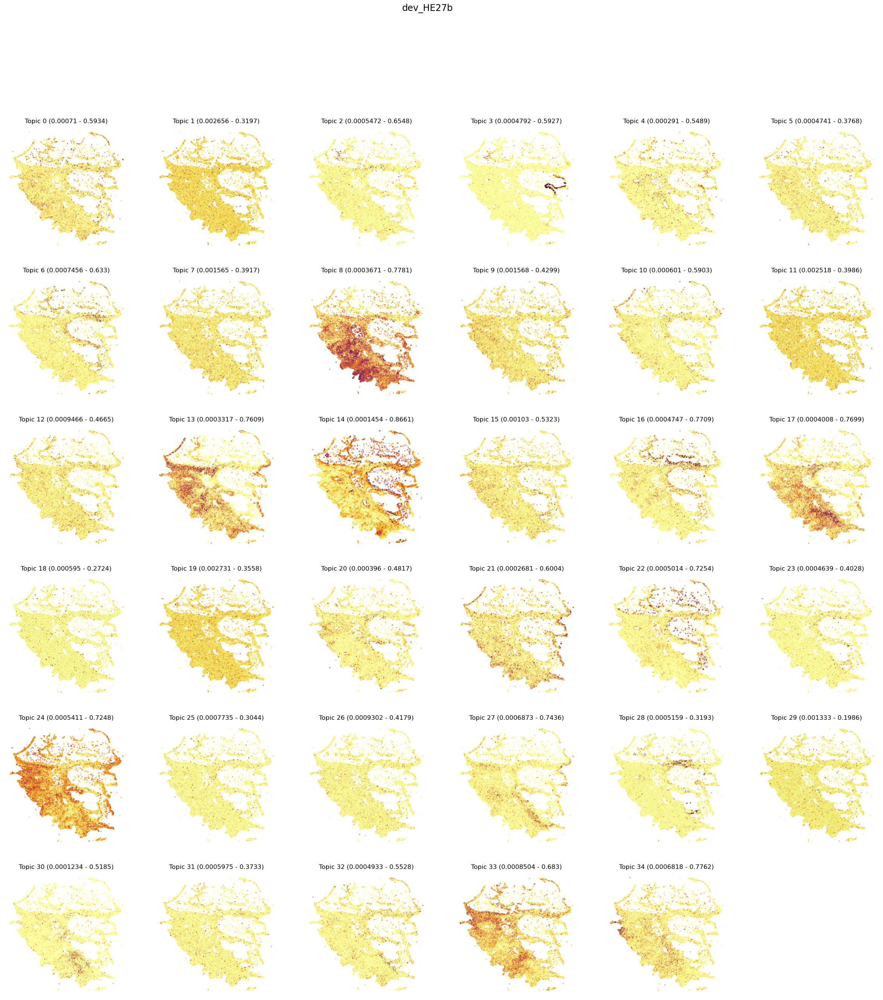

In [6]:
# Colorize the Xenium image with the loading of each topic on the cells
with loompy.connect(adata_loom, 'r') as ds:
    replicates = list(set(ds.ca.replicate))
    for replicate in replicates:
        fig = plt.figure(None, (30, 30), facecolor='white')
        gs = plt.GridSpec(6, 6)
        replicateidx = (ds.ca.replicate == replicate)
        xs = ds.ca.x_centroid[replicateidx]
        ys = ds.ca.y_centroid[replicateidx]
        for i in range(k):
            plt.subplot(gs[i])
            topicweights = adata_transformed[replicateidx,i]
            weights = np.minimum(1.0, topicweights / np.percentile(topicweights, 99.9))
            # weights = topicweights / max(topicweights)
            plt.scatter(xs, ys, c=weights, alpha=0.5, s=5, lw=0, rasterized=True, cmap='inferno_r')
            plt.axis('off')
            plt.title("Topic %s (%.4g - %.4g)" % (i, min(topicweights), max(topicweights)), fontsize=12)
            plt.margins(0.05, 0.05)
        fig.suptitle(replicate, fontsize='xx-large', va='bottom')
        #plt.savefig('Xenium_6w_%s_topics.png' % replicate, dpi=300)
        plt.show()